## Bank Churners Prediction

## A business manager of a consumer credit card portfolio is facing the problem of customer attrition. They want to analyze the data to find out the reason behind this and leverage the same to predict customers who are likely to drop off.

## 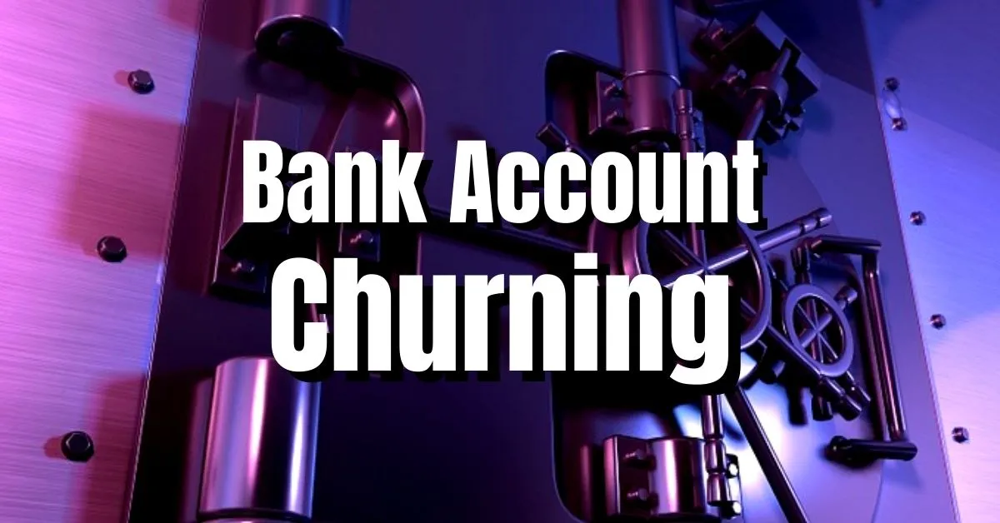

## Data Collection

In [1]:
# import library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## Importing the dataset

In [3]:
dataset=pd.read_csv("Bank churners.csv")

In [4]:
dataset

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


## Preprocess the data

In [6]:

# load the data
df = pd.read_csv('Bank churners.csv')
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [7]:
# check whether this data contains null / categorical value
df.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [9]:
df['Attrition_Flag'].value_counts()

Attrition_Flag
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64

## Dropping the unwanted column to avoid space consumption nd confusion

In [10]:
# Drop unnecessary columns
columns_to_drop = [
    'CLIENTNUM'
]
df_cleaned = df.drop(columns=columns_to_drop)

In [11]:
df_cleaned

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [12]:
## Check all column in dataset are ok to proceed ,if not any different format like categorical /fractions etc..change everthing to int/float format

In [13]:
from sklearn.preprocessing import LabelEncoder

# Encode categorical variables using LabelEncoder
categorical_columns = ['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']
label_encoders = {}
for col in categorical_columns:
    label = LabelEncoder()
    df_cleaned[col] = label.fit_transform(df_cleaned[col])
    label_encoders[col] = label  # Store the encoder for later use if needed

In [14]:
# Scale numerical variables using StandardScaler
from sklearn.preprocessing import StandardScaler
numerical_columns = df_cleaned.select_dtypes(include=['int64', 'float64']).columns.tolist()
scaler = StandardScaler()
df_cleaned[numerical_columns] = scaler.fit_transform(df_cleaned[numerical_columns])

In [15]:
df_cleaned

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0.437506,-0.165406,1.059956,0.503368,-0.052637,-0.628128,-0.574182,-0.259473,0.384621,0.763943,-1.327136,0.492404,0.446622,-0.473422,0.488971,2.623494,-0.959707,-0.973895,3.834003,-0.775882
1,0.437506,0.333570,-0.943436,2.043199,-0.597678,0.727306,0.755053,-0.259473,1.010715,1.407306,-1.327136,-0.411616,-0.041367,-0.366667,-0.008486,3.563293,-0.916433,-1.357340,12.608573,-0.616276
2,0.437506,0.583058,1.059956,0.503368,-0.597678,-0.628128,0.090436,-0.259473,0.008965,0.120579,-1.327136,-2.219655,-0.573698,-1.426858,-0.445658,8.367214,-0.740982,-1.911206,6.807864,-0.997155
3,0.437506,-0.789126,-0.943436,1.273283,-0.052637,2.082739,0.755053,-0.259473,-0.241473,-0.522785,1.641478,-1.315636,-0.585251,1.661686,-0.734100,2.942843,-0.951758,-1.911206,6.807864,1.759686
4,0.437506,-0.789126,1.059956,0.503368,1.037447,-0.628128,-0.574182,-0.259473,-1.869317,0.763943,-1.327136,-2.219655,-0.430877,-1.426858,-0.302868,6.455682,-1.056263,-1.570365,7.509325,-0.997155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0.437506,0.458314,1.059956,-0.266547,-0.597678,0.727306,-1.238799,-0.259473,0.509840,-0.522785,-0.337598,0.492404,-0.509330,0.844455,-0.584929,-0.259771,3.259358,2.221481,0.608119,0.678714
10123,-2.285681,-0.664382,1.059956,-0.266547,1.582489,-1.983561,-1.238799,-0.259473,-1.368442,0.120579,-0.337598,0.492404,-0.479181,1.255524,-0.591639,0.201004,1.283475,0.176440,-0.122745,0.856458
10124,-2.285681,-0.290150,-0.943436,-1.036462,-0.052637,-0.628128,0.755053,-0.259473,0.008965,0.763943,0.651940,1.396424,-0.354626,-1.426858,-0.226632,0.269436,1.732994,-0.207005,0.444305,-0.997155
10125,-2.285681,-2.036565,1.059956,-0.266547,-0.597678,2.082739,-1.238799,-0.259473,0.008965,0.120579,0.651940,0.492404,-0.368710,-1.426858,-0.240713,-1.026208,1.174848,-0.121795,0.041070,-0.997155


In [16]:
df_cleaned.info()
#Now its showing Only int nd float values in dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  float64
 1   Customer_Age              10127 non-null  float64
 2   Gender                    10127 non-null  float64
 3   Dependent_count           10127 non-null  float64
 4   Education_Level           10127 non-null  float64
 5   Marital_Status            10127 non-null  float64
 6   Income_Category           10127 non-null  float64
 7   Card_Category             10127 non-null  float64
 8   Months_on_book            10127 non-null  float64
 9   Total_Relationship_Count  10127 non-null  float64
 10  Months_Inactive_12_mon    10127 non-null  float64
 11  Contacts_Count_12_mon     10127 non-null  float64
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  float64
 14  Avg_Op

In [17]:
df_cleaned.describe()
# provides a summary of statistical measures for the numerical columns in the dataset to check outliers

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,10127.000000,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04
mean,1.403264e-17,1.333101e-16,6.735667e-17,-7.577626e-17,2.385549e-17,5.893709e-17,-2.525875e-17,0.000000,-3.381866e-16,-4.490445e-17,1.613754e-16,-7.858279e-17,1.347133e-16,-7.016320e-17,4.490445e-17,3.830911e-16,-8.980890e-17,-2.245222e-16,-3.115246e-16,-7.296973e-17
std,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00
min,-2.285681e+00,-2.535541e+00,-9.434357e-01,-1.806378e+00,-1.687762e+00,-1.983561e+00,-1.903416e+00,-0.259473,-2.871068e+00,-1.809512e+00,-2.316674e+00,-2.219655e+00,-7.915266e-01,-1.426858e+00,-8.213361e-01,-3.466947e+00,-1.146344e+00,-2.337256e+00,-2.991597e+00,-9.971550e-01
25%,4.375063e-01,-6.643815e-01,-9.434357e-01,-1.036462e+00,-5.976783e-01,-6.281276e-01,-5.741815e-01,-0.259473,-6.171294e-01,-5.227845e-01,-3.375979e-01,-4.116160e-01,-6.686548e-01,-9.863389e-01,-6.759604e-01,-5.882438e-01,-6.619405e-01,-8.460801e-01,-5.469820e-01,-9.137243e-01
50%,4.375063e-01,-4.066159e-02,-9.434357e-01,-2.665471e-01,-5.263660e-02,-6.281276e-01,9.043572e-02,-0.259473,8.964513e-03,1.205790e-01,-3.375979e-01,-4.116160e-01,-4.492525e-01,1.388875e-01,-4.394979e-01,-1.092203e-01,-1.486877e-01,9.123036e-02,-4.293775e-02,-3.587287e-01
75%,4.375063e-01,7.078024e-01,1.059956e+00,5.033681e-01,1.037447e+00,7.273056e-01,7.550529e-01,-0.259473,5.098397e-01,7.639426e-01,6.519402e-01,4.924038e-01,2.679862e-01,7.622408e-01,2.629041e-01,4.519214e-01,9.918090e-02,6.877007e-01,4.443050e-01,8.274384e-01
max,4.375063e-01,3.327426e+00,1.059956e+00,2.043199e+00,1.582489e+00,2.082739e+00,1.419670e+00,4.069499,2.513340e+00,1.407306e+00,3.620555e+00,3.204463e+00,2.848054e+00,1.661686e+00,2.975375e+00,1.203060e+01,4.144855e+00,3.158792e+00,1.260857e+01,2.626640e+00


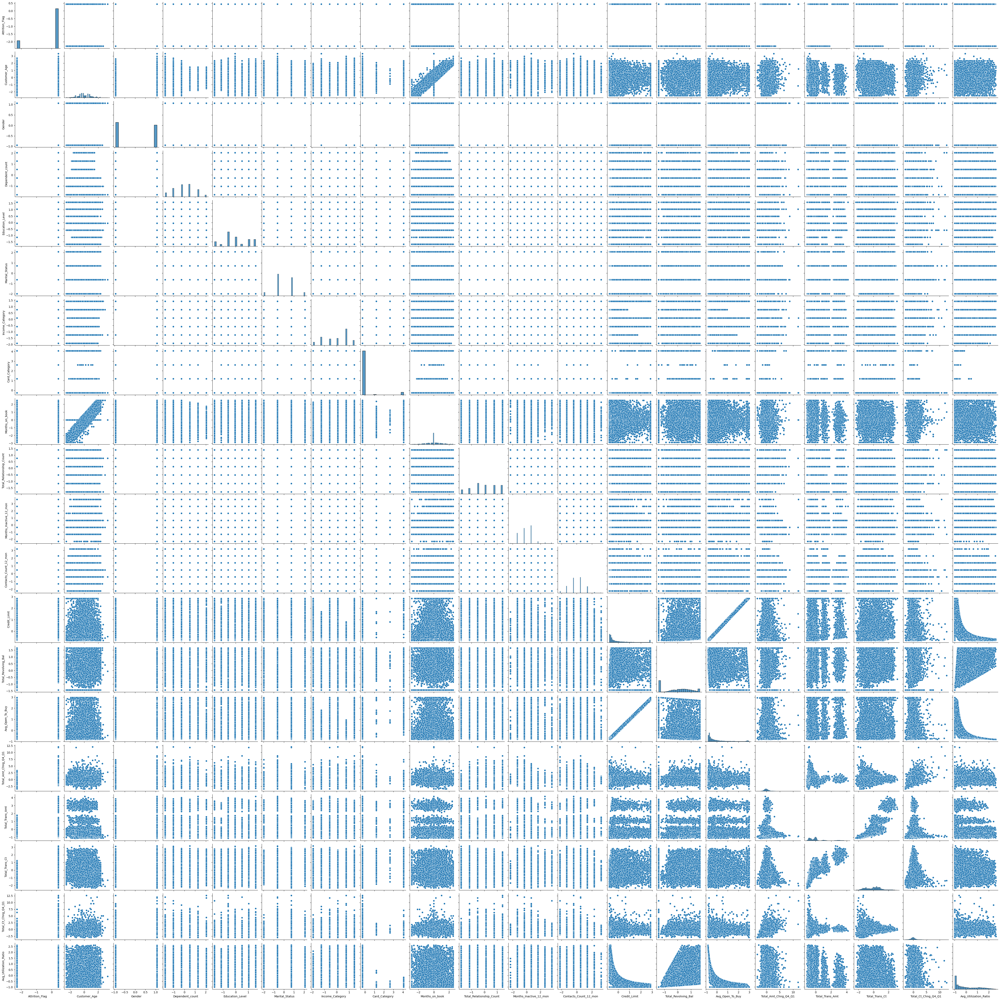

In [18]:
import seaborn as sns
sns.pairplot(df_cleaned)

##  Standarization Process


In [19]:
df_cleaned.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [20]:
df_cleaned.shape

(10127, 20)

## Saving the Preprocessed dataset into New dataset in csv format

In [21]:
df_cleaned.to_csv('Preprocess_Bank_churners.csv',index = False)

In [22]:
df1 = pd.read_csv('Preprocess_Bank_churners.csv')
df1

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0.437506,-0.165406,1.059956,0.503368,-0.052637,-0.628128,-0.574182,-0.259473,0.384621,0.763943,-1.327136,0.492404,0.446622,-0.473422,0.488971,2.623494,-0.959707,-0.973895,3.834003,-0.775882
1,0.437506,0.333570,-0.943436,2.043199,-0.597678,0.727306,0.755053,-0.259473,1.010715,1.407306,-1.327136,-0.411616,-0.041367,-0.366667,-0.008486,3.563293,-0.916433,-1.357340,12.608573,-0.616276
2,0.437506,0.583058,1.059956,0.503368,-0.597678,-0.628128,0.090436,-0.259473,0.008965,0.120579,-1.327136,-2.219655,-0.573698,-1.426858,-0.445658,8.367214,-0.740982,-1.911206,6.807864,-0.997155
3,0.437506,-0.789126,-0.943436,1.273283,-0.052637,2.082739,0.755053,-0.259473,-0.241473,-0.522785,1.641478,-1.315636,-0.585251,1.661686,-0.734100,2.942843,-0.951758,-1.911206,6.807864,1.759686
4,0.437506,-0.789126,1.059956,0.503368,1.037447,-0.628128,-0.574182,-0.259473,-1.869317,0.763943,-1.327136,-2.219655,-0.430877,-1.426858,-0.302868,6.455682,-1.056263,-1.570365,7.509325,-0.997155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0.437506,0.458314,1.059956,-0.266547,-0.597678,0.727306,-1.238799,-0.259473,0.509840,-0.522785,-0.337598,0.492404,-0.509330,0.844455,-0.584929,-0.259771,3.259358,2.221481,0.608119,0.678714
10123,-2.285681,-0.664382,1.059956,-0.266547,1.582489,-1.983561,-1.238799,-0.259473,-1.368442,0.120579,-0.337598,0.492404,-0.479181,1.255524,-0.591639,0.201004,1.283475,0.176440,-0.122745,0.856458
10124,-2.285681,-0.290150,-0.943436,-1.036462,-0.052637,-0.628128,0.755053,-0.259473,0.008965,0.763943,0.651940,1.396424,-0.354626,-1.426858,-0.226632,0.269436,1.732994,-0.207005,0.444305,-0.997155
10125,-2.285681,-2.036565,1.059956,-0.266547,-0.597678,2.082739,-1.238799,-0.259473,0.008965,0.120579,0.651940,0.492404,-0.368710,-1.426858,-0.240713,-1.026208,1.174848,-0.121795,0.041070,-0.997155


In [23]:
df1['Attrition_Flag'].value_counts()

Attrition_Flag
 0.437506    8500
-2.285681    1627
Name: count, dtype: int64

In [24]:
df1['Attrition_Flag'].unique()

array([ 0.4375063 , -2.28568136])

In [25]:
#info function using for separate the row and columns shows total num of float64(6), int64(1), object(8),and shows total num of rows and columns.() is open parathasis
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  float64
 1   Customer_Age              10127 non-null  float64
 2   Gender                    10127 non-null  float64
 3   Dependent_count           10127 non-null  float64
 4   Education_Level           10127 non-null  float64
 5   Marital_Status            10127 non-null  float64
 6   Income_Category           10127 non-null  float64
 7   Card_Category             10127 non-null  float64
 8   Months_on_book            10127 non-null  float64
 9   Total_Relationship_Count  10127 non-null  float64
 10  Months_Inactive_12_mon    10127 non-null  float64
 11  Contacts_Count_12_mon     10127 non-null  float64
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  float64
 14  Avg_Op

In [26]:
df1.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0.437506,-0.165406,1.059956,0.503368,-0.052637,-0.628128,-0.574182,-0.259473,0.384621,0.763943,-1.327136,0.492404,0.446622,-0.473422,0.488971,2.623494,-0.959707,-0.973895,3.834003,-0.775882
1,0.437506,0.333570,-0.943436,2.043199,-0.597678,0.727306,0.755053,-0.259473,1.010715,1.407306,-1.327136,-0.411616,-0.041367,-0.366667,-0.008486,3.563293,-0.916433,-1.357340,12.608573,-0.616276
2,0.437506,0.583058,1.059956,0.503368,-0.597678,-0.628128,0.090436,-0.259473,0.008965,0.120579,-1.327136,-2.219655,-0.573698,-1.426858,-0.445658,8.367214,-0.740982,-1.911206,6.807864,-0.997155
3,0.437506,-0.789126,-0.943436,1.273283,-0.052637,2.082739,0.755053,-0.259473,-0.241473,-0.522785,1.641478,-1.315636,-0.585251,1.661686,-0.734100,2.942843,-0.951758,-1.911206,6.807864,1.759686
4,0.437506,-0.789126,1.059956,0.503368,1.037447,-0.628128,-0.574182,-0.259473,-1.869317,0.763943,-1.327136,-2.219655,-0.430877,-1.426858,-0.302868,6.455682,-1.056263,-1.570365,7.509325,-0.997155


In [27]:
df1.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [28]:
def Univariate(dataset):
    quan=[]
    qual=[]
    for columnName in df1.columns:
        #print(columnName)
        if(df1[columnName].dtype=='O'):
            #print("qual")
            qual.append(columnName)
        else:
            #print("quan")
            quan.append(columnName)
    return quan,qual  

In [29]:
Univariate(df1)

(['Attrition_Flag',
  'Customer_Age',
  'Gender',
  'Dependent_count',
  'Education_Level',
  'Marital_Status',
  'Income_Category',
  'Card_Category',
  'Months_on_book',
  'Total_Relationship_Count',
  'Months_Inactive_12_mon',
  'Contacts_Count_12_mon',
  'Credit_Limit',
  'Total_Revolving_Bal',
  'Avg_Open_To_Buy',
  'Total_Amt_Chng_Q4_Q1',
  'Total_Trans_Amt',
  'Total_Trans_Ct',
  'Total_Ct_Chng_Q4_Q1',
  'Avg_Utilization_Ratio'],
 [])

In [30]:
quan,qual=Univariate(df1)

In [31]:
quan

['Attrition_Flag',
 'Customer_Age',
 'Gender',
 'Dependent_count',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category',
 'Months_on_book',
 'Total_Relationship_Count',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Total_Revolving_Bal',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1',
 'Avg_Utilization_Ratio']

In [32]:
qual

[]

In [33]:
#1)Describing the data.
df1.describe()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,10127.000000,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04,1.012700e+04
mean,1.403264e-17,1.389231e-16,6.735667e-17,-9.261543e-17,2.385549e-17,5.893709e-17,1.122611e-17,0.000000,-3.381866e-16,-4.490445e-17,1.613754e-16,-7.858279e-17,1.122611e-16,-7.016320e-17,4.490445e-17,3.592356e-16,-1.347133e-16,-2.245222e-16,-3.073148e-16,-4.490445e-17
std,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00,1.000049e+00
min,-2.285681e+00,-2.535541e+00,-9.434357e-01,-1.806378e+00,-1.687762e+00,-1.983561e+00,-1.903416e+00,-0.259473,-2.871068e+00,-1.809512e+00,-2.316674e+00,-2.219655e+00,-7.915266e-01,-1.426858e+00,-8.213361e-01,-3.466947e+00,-1.146344e+00,-2.337256e+00,-2.991597e+00,-9.971550e-01
25%,4.375063e-01,-6.643815e-01,-9.434357e-01,-1.036462e+00,-5.976783e-01,-6.281276e-01,-5.741815e-01,-0.259473,-6.171294e-01,-5.227845e-01,-3.375979e-01,-4.116160e-01,-6.686548e-01,-9.863389e-01,-6.759604e-01,-5.882438e-01,-6.619405e-01,-8.460801e-01,-5.469820e-01,-9.137243e-01
50%,4.375063e-01,-4.066159e-02,-9.434357e-01,-2.665471e-01,-5.263660e-02,-6.281276e-01,9.043572e-02,-0.259473,8.964513e-03,1.205790e-01,-3.375979e-01,-4.116160e-01,-4.492525e-01,1.388875e-01,-4.394979e-01,-1.092203e-01,-1.486877e-01,9.123036e-02,-4.293775e-02,-3.587287e-01
75%,4.375063e-01,7.078024e-01,1.059956e+00,5.033681e-01,1.037447e+00,7.273056e-01,7.550529e-01,-0.259473,5.098397e-01,7.639426e-01,6.519402e-01,4.924038e-01,2.679862e-01,7.622408e-01,2.629041e-01,4.519214e-01,9.918090e-02,6.877007e-01,4.443050e-01,8.274384e-01
max,4.375063e-01,3.327426e+00,1.059956e+00,2.043199e+00,1.582489e+00,2.082739e+00,1.419670e+00,4.069499,2.513340e+00,1.407306e+00,3.620555e+00,3.204463e+00,2.848054e+00,1.661686e+00,2.975375e+00,1.203060e+01,4.144855e+00,3.158792e+00,1.260857e+01,2.626640e+00


## 2) Creating statistical values table.

In [34]:
descriptive=pd.DataFrame(index=["Mean","Median","Mode","Q1:25%","Q2:50%","Q3:75%","Q4:100%","IQR","1.5rule","Lesser","Greater","Min","Max"],columns=quan)
for columnName in df1.columns:
   descriptive.loc["Mean", columnName]=df1[columnName].mean()
   descriptive.loc["Median", columnName]=df1[columnName].median()
   descriptive.loc["Mode", columnName]=df1[columnName].mode()[0]
   descriptive.loc["Q1:25%", columnName]=df1.describe()[columnName]["25%"]
   descriptive.loc["Q2:50%", columnName]=df1.describe()[columnName]["50%"]
   descriptive.loc["Q3:75%", columnName]=df1.describe()[columnName]["75%"]
   descriptive.loc["Q4:100%", columnName]=df1.describe()[columnName]["max"]
   descriptive.loc["IQR", columnName]= descriptive.loc["Q3:75%", columnName]-descriptive.loc["Q1:25%", columnName]
   descriptive.loc["1.5rule", columnName]=1.5* descriptive.loc["IQR", columnName]
   descriptive.loc["Lesser", columnName]=descriptive.loc["Q1:25%", columnName]-descriptive.loc["1.5rule", columnName]
   descriptive.loc["Greater", columnName]=descriptive.loc["Q3:75%", columnName]+descriptive.loc["1.5rule", columnName]
   descriptive.loc["Min", columnName]=df1[columnName].min()
   descriptive.loc["Max", columnName]=df1[columnName].max()

In [35]:
descriptive

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Mean,0.0,0.0,0.0,-0.0,0.0,0.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,-0.0,-0.0
Median,0.437506,-0.040662,-0.943436,-0.266547,-0.052637,-0.628128,0.090436,-0.259473,0.008965,0.120579,-0.337598,-0.411616,-0.449252,0.138887,-0.439498,-0.10922,-0.148688,0.09123,-0.042938,-0.358729
Mode,0.437506,-0.29015,-0.943436,0.503368,-0.597678,-0.628128,0.755053,-0.259473,0.008965,-0.522785,0.65194,0.492404,2.848054,-1.426858,-0.663441,0.141697,-0.044477,0.687701,-0.189951,-0.997155
Q1:25%,0.437506,-0.664382,-0.943436,-1.036462,-0.597678,-0.628128,-0.574182,-0.259473,-0.617129,-0.522785,-0.337598,-0.411616,-0.668655,-0.986339,-0.67596,-0.588244,-0.66194,-0.84608,-0.546982,-0.913724
Q2:50%,0.437506,-0.040662,-0.943436,-0.266547,-0.052637,-0.628128,0.090436,-0.259473,0.008965,0.120579,-0.337598,-0.411616,-0.449252,0.138887,-0.439498,-0.10922,-0.148688,0.09123,-0.042938,-0.358729
Q3:75%,0.437506,0.707802,1.059956,0.503368,1.037447,0.727306,0.755053,-0.259473,0.50984,0.763943,0.65194,0.492404,0.267986,0.762241,0.262904,0.451921,0.099181,0.687701,0.444305,0.827438
Q4:100%,0.437506,3.327426,1.059956,2.043199,1.582489,2.082739,1.41967,4.069499,2.51334,1.407306,3.620555,3.204463,2.848054,1.661686,2.975375,12.030603,4.144855,3.158792,12.608573,2.62664
IQR,0.0,1.372184,2.003391,1.539831,1.635125,1.355433,1.329234,0.0,1.126969,1.286727,0.989538,0.90402,0.936641,1.74858,0.938864,1.040165,0.761121,1.533781,0.991287,1.741163
1.5rule,0.0,2.058276,3.005087,2.309746,2.452688,2.03315,1.993852,0.0,1.690454,1.930091,1.484307,1.35603,1.404961,2.62287,1.408297,1.560248,1.141682,2.300671,1.486931,2.611744
Lesser,0.437506,-2.722657,-3.948523,-3.346208,-3.050366,-2.661277,-2.568033,-0.259473,-2.307583,-2.452875,-1.821905,-1.767646,-2.073616,-3.609209,-2.084257,-2.148492,-1.803623,-3.146751,-2.033913,-3.525468


## Checking for outlier ,if presents remove it.

In [36]:
lesser=[]
Greater=[]
for columnName in quan:
    if(descriptive[columnName]["Min"])<descriptive[columnName]["Lesser"]:
        lesser.append(columnName)
    if(descriptive[columnName]["Max"])>descriptive[columnName]["Greater"]:
        Greater.append(columnName)

In [37]:
lesser

['Attrition_Flag',
 'Months_on_book',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Ct_Chng_Q4_Q1']

In [38]:
Greater

['Customer_Age',
 'Card_Category',
 'Months_on_book',
 'Months_Inactive_12_mon',
 'Contacts_Count_12_mon',
 'Credit_Limit',
 'Avg_Open_To_Buy',
 'Total_Amt_Chng_Q4_Q1',
 'Total_Trans_Amt',
 'Total_Trans_Ct',
 'Total_Ct_Chng_Q4_Q1']

In [39]:
# For columns in 'lesser', replace values that are less than the threshold with the "Lesser" value from the descriptive DataFrame
for columnName in lesser:
    df1.loc[df1[columnName] < descriptive.loc["Lesser", columnName], columnName] = descriptive.loc["Lesser", columnName]

# For columns in 'greater', replace values that are greater than the threshold with the "Greater" value from the descriptive DataFrame
for columnName in Greater:
    df1.loc[df1[columnName] > descriptive.loc["Greater", columnName], columnName] = descriptive.loc["Greater", columnName]

In [40]:
descriptive=pd.DataFrame(index=["Mean","Median","Mode","Q1:25%","Q2:50%","Q3:75%","Q4:100%","IQR","1.5rule","Lesser","Greater","Min","Max"],columns=quan)
for columnName in df1.columns:
   descriptive.loc["Mean", columnName]=df1[columnName].mean()
   descriptive.loc["Median", columnName]=df1[columnName].median()
   descriptive.loc["Mode", columnName]=df1[columnName].mode()[0]
   descriptive.loc["Q1:25%", columnName]=df1.describe()[columnName]["25%"]
   descriptive.loc["Q2:50%", columnName]=df1.describe()[columnName]["50%"]
   descriptive.loc["Q3:75%", columnName]=df1.describe()[columnName]["75%"]
   descriptive.loc["Q4:100%", columnName]=df1.describe()[columnName]["max"]
   descriptive.loc["IQR", columnName]= descriptive.loc["Q3:75%", columnName]-descriptive.loc["Q1:25%", columnName]
   descriptive.loc["1.5rule", columnName]=1.5* descriptive.loc["IQR", columnName]
   descriptive.loc["Lesser", columnName]=descriptive.loc["Q1:25%", columnName]-descriptive.loc["1.5rule", columnName]
   descriptive.loc["Greater", columnName]=descriptive.loc["Q3:75%", columnName]+descriptive.loc["1.5rule", columnName]
   descriptive.loc["Min", columnName]=df1[columnName].min()
   descriptive.loc["Max", columnName]=df1[columnName].max()

In [41]:
descriptive

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Mean,0.437506,-0.000074,0.0,-0.0,0.0,0.0,0.0,-0.259473,0.002127,-0.0,-0.025454,0.002723,-0.082484,-0.0,-0.082337,-0.039022,-0.13416,-0.000029,-0.036705,-0.0
Median,0.437506,-0.040662,-0.943436,-0.266547,-0.052637,-0.628128,0.090436,-0.259473,0.008965,0.120579,-0.337598,-0.411616,-0.449252,0.138887,-0.439498,-0.10922,-0.148688,0.09123,-0.042938,-0.358729
Mode,0.437506,-0.29015,-0.943436,0.503368,-0.597678,-0.628128,0.755053,-0.259473,0.008965,-0.522785,0.65194,0.492404,1.672948,-1.426858,1.671201,2.012169,1.240863,0.687701,1.931236,-0.997155
Q1:25%,0.437506,-0.664382,-0.943436,-1.036462,-0.597678,-0.628128,-0.574182,-0.259473,-0.617129,-0.522785,-0.337598,-0.411616,-0.668655,-0.986339,-0.67596,-0.588244,-0.66194,-0.84608,-0.546982,-0.913724
Q2:50%,0.437506,-0.040662,-0.943436,-0.266547,-0.052637,-0.628128,0.090436,-0.259473,0.008965,0.120579,-0.337598,-0.411616,-0.449252,0.138887,-0.439498,-0.10922,-0.148688,0.09123,-0.042938,-0.358729
Q3:75%,0.437506,0.707802,1.059956,0.503368,1.037447,0.727306,0.755053,-0.259473,0.50984,0.763943,0.65194,0.492404,0.267986,0.762241,0.262904,0.451921,0.099181,0.687701,0.444305,0.827438
Q4:100%,0.437506,2.766078,1.059956,2.043199,1.582489,2.082739,1.41967,-0.259473,2.200293,1.407306,2.136247,1.848433,1.672948,1.661686,1.671201,2.012169,1.240863,2.988372,1.931236,2.62664
IQR,0.0,1.372184,2.003391,1.539831,1.635125,1.355433,1.329234,0.0,1.126969,1.286727,0.989538,0.90402,0.936641,1.74858,0.938864,1.040165,0.761121,1.533781,0.991287,1.741163
1.5rule,0.0,2.058276,3.005087,2.309746,2.452688,2.03315,1.993852,0.0,1.690454,1.930091,1.484307,1.35603,1.404961,2.62287,1.408297,1.560248,1.141682,2.300671,1.486931,2.611744
Lesser,0.437506,-2.722657,-3.948523,-3.346208,-3.050366,-2.661277,-2.568033,-0.259473,-2.307583,-2.452875,-1.821905,-1.767646,-2.073616,-3.609209,-2.084257,-2.148492,-1.803623,-3.146751,-2.033913,-3.525468


In [42]:
lesser=[]
Greater=[]
for columnName in quan:
    if(descriptive[columnName]["Min"])<descriptive[columnName]["Lesser"]:
        lesser.append(columnName)
    if(descriptive[columnName]["Max"])>descriptive[columnName]["Greater"]:
        Greater.append(columnName)

In [43]:
lesser

[]

In [44]:
Greater

[]

In [45]:
df1.shape

(10127, 20)

In [46]:
object_columns = df1.select_dtypes(include=['object']).columns
print(object_columns)

Index([], dtype='object')


In [47]:
df1.isnull().sum()

Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

## Finding frequency,Covariance and Correlation for data¶

In [48]:
def freq_Table(columnName, df1):
    # Use a different name for the DataFrame variable (to avoid conflict with the function name)
    freq_table_df = pd.DataFrame()  # Initialize an empty DataFrame to store results
    
    # Access the specified column dynamically using the passed columnName
    freq_table_df["Unique_Values"] = df1[columnName].value_counts().index
    freq_table_df["Frequency"] = df1[columnName].value_counts().values  # Use .values to get the actual frequencies
    freq_table_df["Relative_Frequency"] = freq_table_df["Frequency"] / len(df1)  # Divide by total number of rows
    freq_table_df["Cumsum"] = freq_table_df["Relative_Frequency"].cumsum()  # Cumulative sum of relative frequencies
    
    return freq_table_df

In [49]:
freq_Table(columnName, df1)

,Unique_Values,Frequency,Relative_Frequency,Cumsum
0,-0.997155,2470,0.243902,0.243902
1,-0.732353,44,0.004345,0.248247
2,-0.790392,33,0.003259,0.251506
3,-0.823039,32,0.003160,0.254666
4,-0.779510,30,0.002962,0.257628
...,...,...,...,...
959,2.586738,1,0.000099,0.999605
960,-0.979018,1,0.000099,0.999704
961,-0.971763,1,0.000099,0.999803
962,-0.946371,1,0.000099,0.999901


In [50]:
df1.cov(numeric_only=True)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Customer_Age,0.0,0.999655,-0.017392,-0.122132,0.004088,-0.011220,-0.013421,0.0,0.766886,-0.010965,0.048013,-0.017147,0.002143,0.014776,0.000676,-0.059700,-0.025751,-0.066995,-0.023082,0.007107
Gender,0.0,-0.017392,1.000099,0.004563,0.000695,-0.000007,-0.539784,0.0,-0.006617,0.003157,-0.008977,0.037958,0.348883,0.029661,0.346299,0.012960,-0.012562,-0.067466,-0.017188,-0.257876
Dependent_count,0.0,-0.122132,0.004563,1.000099,0.003788,0.000337,-0.035420,0.0,-0.103773,-0.039080,-0.009589,-0.039860,0.050690,-0.002688,0.051021,-0.027945,0.032610,0.049922,0.010260,-0.037139
Education_Level,0.0,0.004088,0.000695,0.003788,1.000099,0.014721,-0.010443,0.0,-0.003785,0.009637,-0.008549,0.006703,0.004743,0.008030,0.004245,0.007251,0.008438,0.003020,0.004914,0.006477
Marital_Status,0.0,-0.011220,-0.000007,0.000337,0.014721,1.000099,0.009660,0.0,-0.010907,-0.021395,0.002334,0.000310,0.023430,-0.025388,0.025316,-0.021763,0.045707,0.075914,0.005712,-0.027453
Income_Category,0.0,-0.013421,-0.539784,-0.035420,-0.010443,0.009660,1.000099,0.0,-0.015646,0.008139,0.021575,-0.015423,-0.179399,-0.025817,-0.177231,-0.001529,0.004079,0.033515,0.015452,0.123299
Card_Category,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Months_on_book,0.0,0.766886,-0.006617,-0.103773,-0.003785,-0.010907,-0.015646,0.0,0.947484,-0.009449,0.064000,-0.007778,0.006166,0.008105,0.005226,-0.045862,-0.020807,-0.048625,-0.021472,-0.006869
Total_Relationship_Count,0.0,-0.010965,0.003157,-0.039080,0.009637,-0.021395,0.008139,0.0,-0.009449,1.000099,-0.003916,0.061022,-0.050562,0.013727,-0.051840,0.036023,-0.227413,-0.241872,0.031501,0.067670


In [51]:
 df1.corr(numeric_only=True)
corr_matrix = df1.corr(numeric_only=True).fillna(0)

In [52]:
corr_matrix

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Customer_Age,0.0,1.000000,-0.017394,-0.122147,0.004088,-0.011222,-0.013422,0.0,0.787989,-0.010966,0.052163,-0.018494,0.002699,0.014778,0.000851,-0.070923,-0.040467,-0.067010,-0.027871,0.007108
Gender,0.0,-0.017394,1.000000,0.004563,0.000694,-0.000007,-0.539731,0.0,-0.006797,0.003157,-0.009751,0.040931,0.439319,0.029658,0.435767,0.015393,-0.019736,-0.067466,-0.020749,-0.257851
Dependent_count,0.0,-0.122147,0.004563,1.000000,0.003788,0.000337,-0.035417,0.0,-0.106605,-0.039076,-0.010415,-0.042982,0.063830,-0.002688,0.064203,-0.033191,0.051236,0.049922,0.012386,-0.037135
Education_Level,0.0,0.004088,0.000694,0.003788,1.000000,0.014720,-0.010442,0.0,-0.003888,0.009636,-0.009286,0.007228,0.005973,0.008029,0.005341,0.008612,0.013258,0.003020,0.005932,0.006477
Marital_Status,0.0,-0.011222,-0.000007,0.000337,0.014720,1.000000,0.009659,0.0,-0.011205,-0.021393,0.002535,0.000334,0.029504,-0.025386,0.031856,-0.025848,0.071812,0.075914,0.006896,-0.027451
Income_Category,0.0,-0.013422,-0.539731,-0.035417,-0.010442,0.009659,1.000000,0.0,-0.016073,0.008138,0.023434,-0.016630,-0.225902,-0.025815,-0.223019,-0.001816,0.006409,0.033515,0.018653,0.123287
Card_Category,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Months_on_book,0.0,0.787989,-0.006797,-0.106605,-0.003888,-0.011205,-0.016073,0.0,1.000000,-0.009707,0.071422,-0.008617,0.007977,0.008326,0.006756,-0.055963,-0.033587,-0.049957,-0.026631,-0.007056
Total_Relationship_Count,0.0,-0.010966,0.003157,-0.039076,0.009636,-0.021393,0.008138,0.0,-0.009707,1.000000,-0.004254,0.065801,-0.063668,0.013726,-0.065233,0.042785,-0.357301,-0.241870,0.038028,0.067663


## Hypothesis testing
## Hypothesis 1: Test whether the average Credit_Limit is the same for married and single customers.

In [53]:
from scipy.stats import ttest_ind

# Filter data for married and single customers
married = df[df['Marital_Status'] == 'Married']['Credit_Limit']
single = df[df['Marital_Status'] == 'Single']['Credit_Limit']

# Perform t-test
t_stat, p_value = ttest_ind(married, single, equal_var=False)  # Welch's t-test
print(f"T-statistic: {t_stat}, P-value: {p_value}")


T-statistic: -4.7112200276445595, P-value: 2.5036253251585425e-06


## It is alternate hypothesis,because Credit Limit for married and single customers is significantly different.
## Hypothesis 2: Test whether Total_Trans_Amt and Total_Trans_Ct are correlated

In [54]:
from scipy.stats import pearsonr

# Calculate correlation
correlation, p_value = pearsonr(df['Total_Trans_Amt'], df['Total_Trans_Ct'])
print(f"Correlation: {correlation}, P-value: {p_value}")


Correlation: 0.807192034651435, P-value: 0.0


## It also rejects null hypothesis ,because There is a statistically significant correlation between Total_Trans_Amt and Total_Trans_Ct.
## What is the Distribution of Existing customer vs Attrited customer?

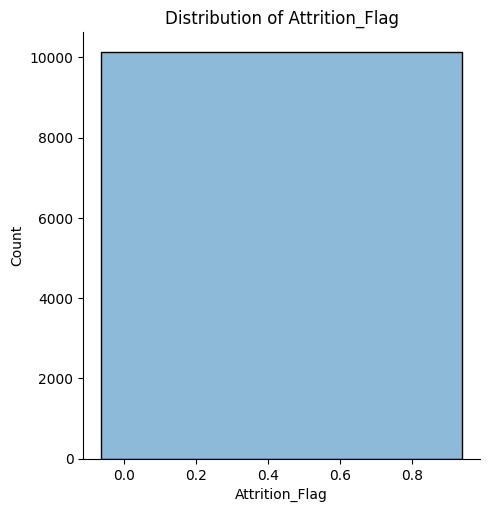

In [55]:
import seaborn as sns
# Strip whitespace from all column names
df.columns = df.columns.str.strip()

# Ensure the column name matches exactly
sns.displot(df1["Attrition_Flag"], kde=True)  # No extra space in column name
plt.title("Distribution of Attrition_Flag")
plt.show()


## How overrall column distributed?

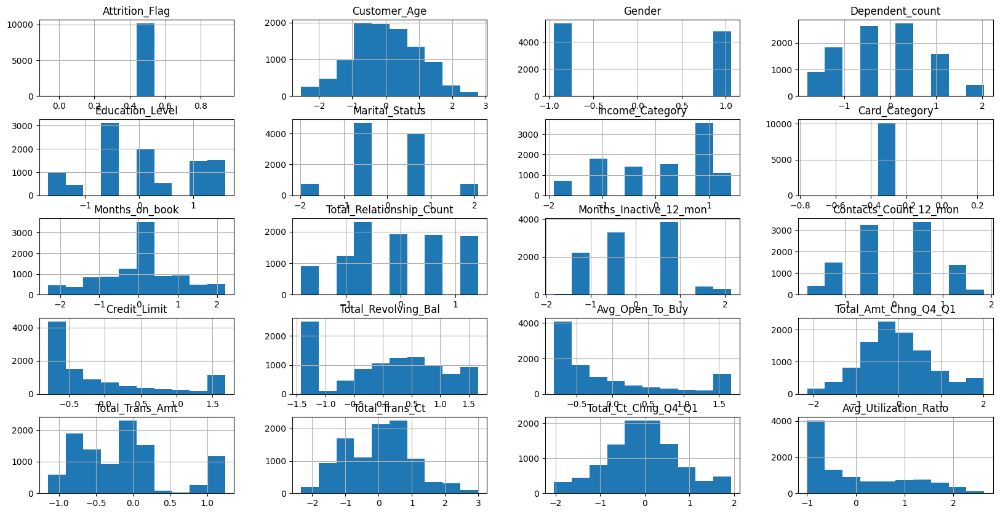

In [56]:
df1.hist(figsize=(20, 10))
plt.show()

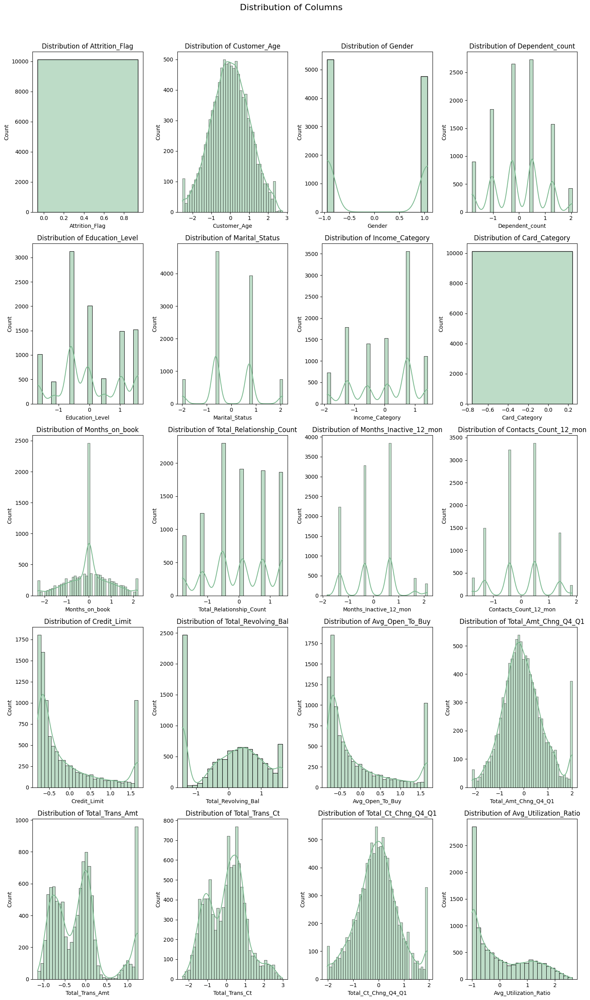

In [57]:
import seaborn as sns
import matplotlib.pyplot as plt
import math

# Set the seaborn palette
sns.set_palette('crest')

# Calculate the number of rows and columns for subplots
n_cols = 4  # Number of columns in the grid
n_rows = math.ceil(len(df1.columns) / n_cols)  # Calculate rows dynamically

# Create subplots
fig, ax = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))

# Flatten the axes array for easier indexing
ax = ax.flatten()

# Plot histograms with KDE for each column
for i, col in enumerate(df1.columns):
    sns.histplot(df1[col], kde=True, ax=ax[i])
    ax[i].set_title(f'Distribution of {col}')



# Set the title of the entire figure
fig.suptitle('Distribution of Columns', y=1.02, fontsize=16)

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


## What is normal distribution of Attrited flag?

C:\Users\Malya\AppData\Local\Temp\ipykernel_9276\2320585190.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  graph = sns.distplot(df1,kde = True,kde_kws={'color':'red'},color='green')
C:\Users\Malya\anaconda3\envs\aimlds\lib\site-packages\seaborn\distributions.py:2496: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  kdeplot(**{axis: a}, ax=ax, color=kde_color, **kde_kws)


Mean: 0.4375063024756128 Std Dev: 0.0


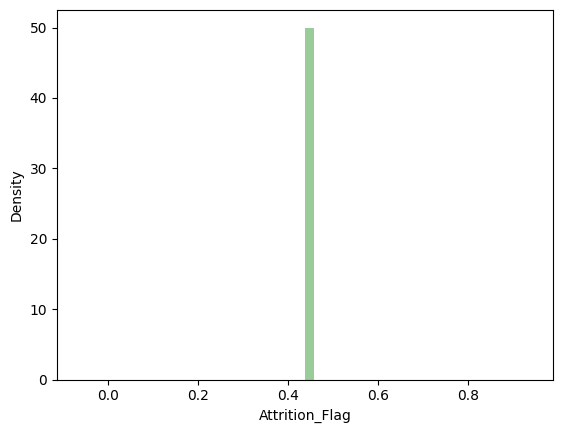

In [58]:
def get_pdf_probability(df1): # creating a function with dataset,start and end range of the data.
    from matplotlib import pyplot as py # importing lib
    import seaborn as sns
    graph = sns.distplot(df1,kde = True,kde_kws={'color':'red'},color='green')
    # kde(Kernal density function) - for curve, kde_kws - for color of that curve, colour green is for that histo colour.
    
    #generate a sample mean and std
    sample = df1
    # to find a mean and std dev
    sample_mean = sample.mean()
    sample_std = sample.std()
#     print('Mean=%.3f, Standard Deviation=%.3f' % (sample_mean, sample_std))
    print("Mean:",sample_mean, "Std Dev:",sample_std)
    #to define normal dist
    from scipy.stats import norm # norm is an inbuilt func need to import library
    dist = norm(sample_mean, sample_std) # to find the normal distribution 
    
get_pdf_probability(df1['Attrition_Flag']) 

## Target Column For Prediction

In [59]:
def plot_pie_single(column):
    target_column = df[column].value_counts()
    plt.figure(figsize=(12, 8))
    fig1, ax1 = plt.subplots()
    ax1.pie(target_column, labels=target_column.index, autopct='%1.1f%%', shadow=None)
    ax1.axis('equal')
    plt.title(f"{column}_Value_Counts", fontweight="bold", size=14)
    plt.show()

<Figure size 1200x800 with 0 Axes>

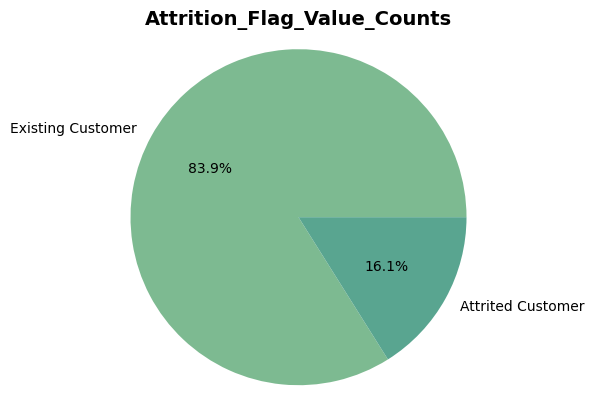

In [60]:
plot_pie_single("Attrition_Flag")

In [61]:
# Splitting data for Churned or Non-Churned

churned = df1[df1['Attrition_Flag'] == "Attrited Customer"]
non_churned = df1[df1['Attrition_Flag'] == "Existing Customer"]

## What is the combination of overall column vs Attrited flag

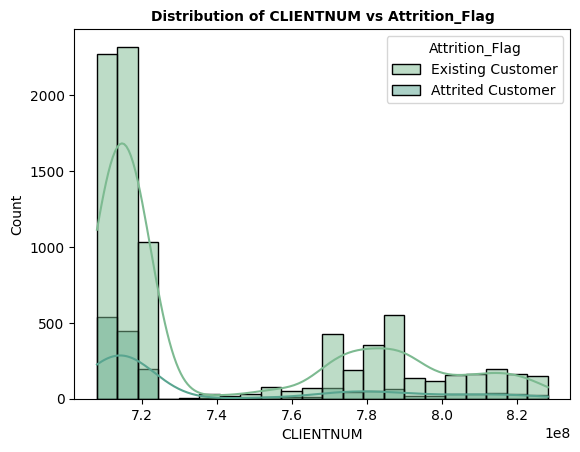

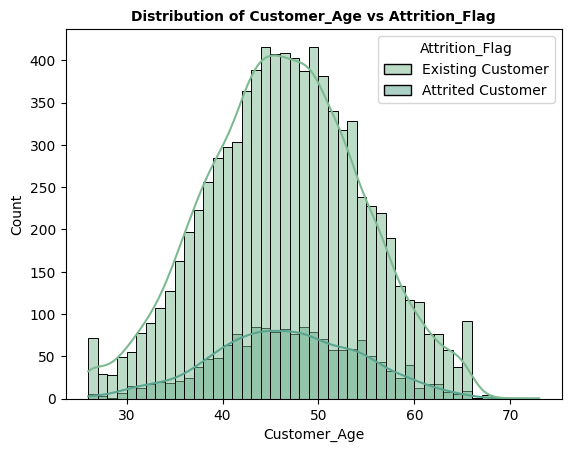

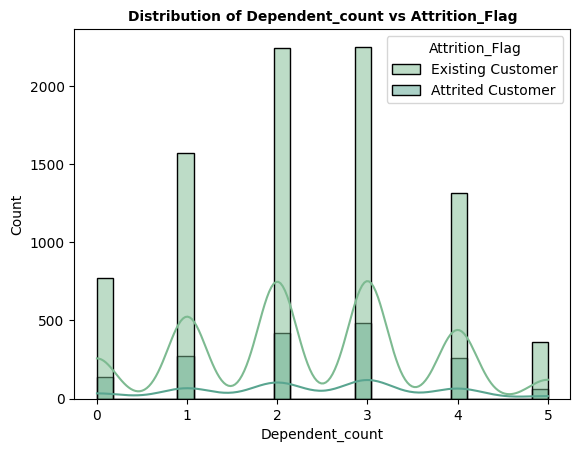

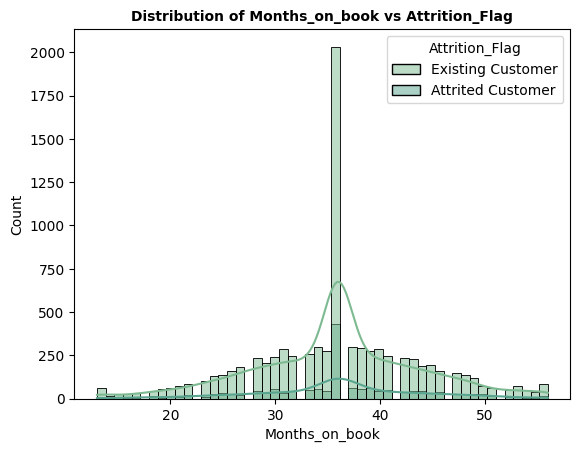

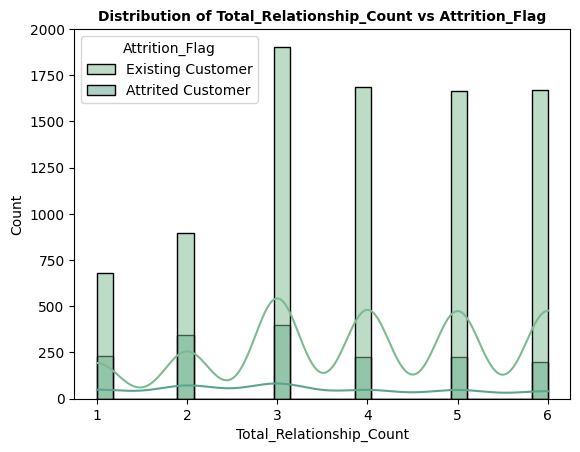

...

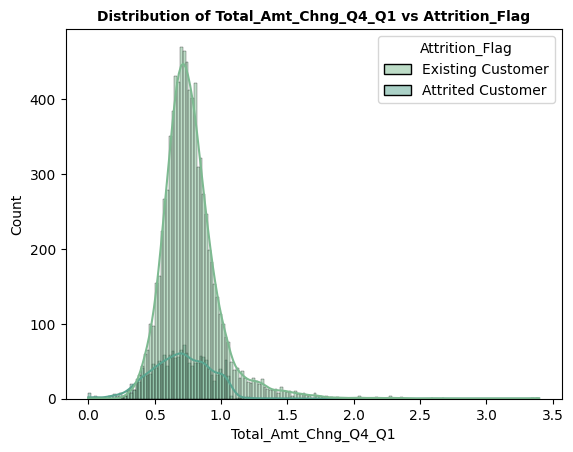

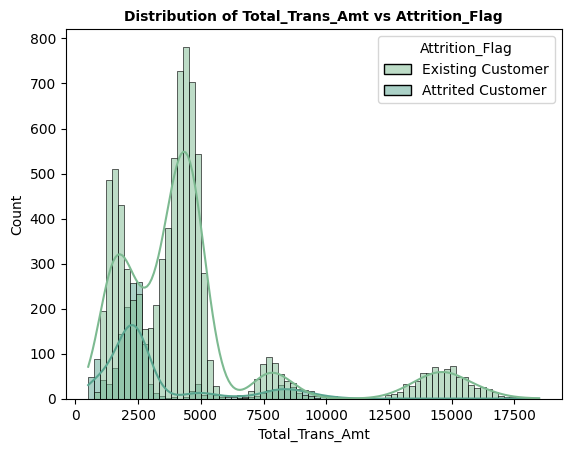

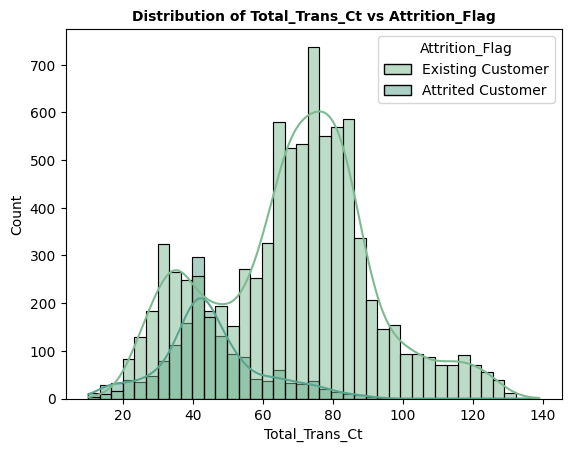

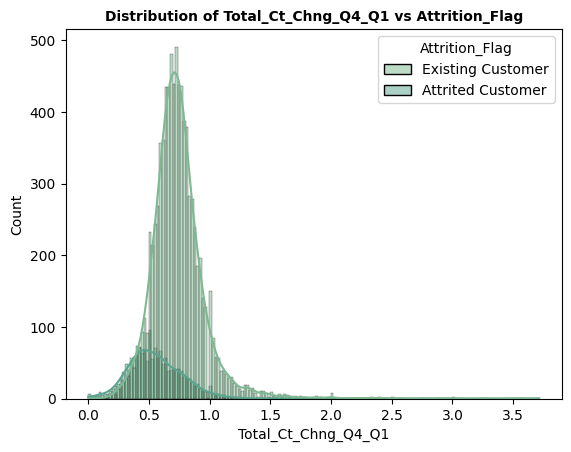

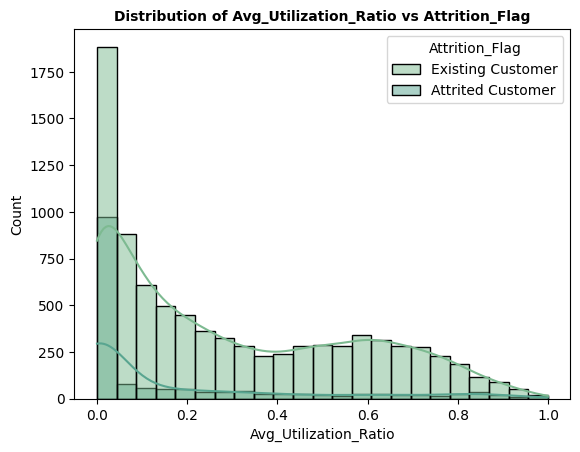

In [62]:
num_col = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

# Plot histograms
for col in num_col:
    sns.histplot(df, x=col, hue='Attrition_Flag', kde=True)
    plt.title(f'Distribution of {col} vs Attrition_Flag', fontweight="bold", size=10)
    plt.show()
    print("\n")

## Important columns Distribution percentage

<Figure size 1200x800 with 0 Axes>

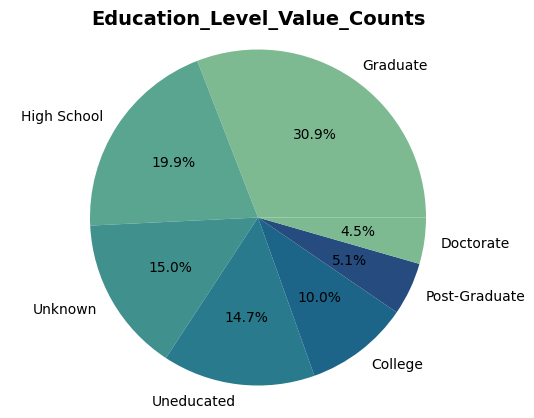

In [64]:
plot_pie_single("Education_Level")

<Figure size 1200x800 with 0 Axes>

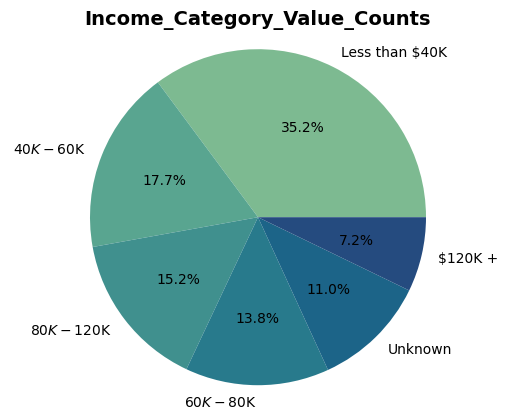

In [65]:
plot_pie_single("Income_Category")

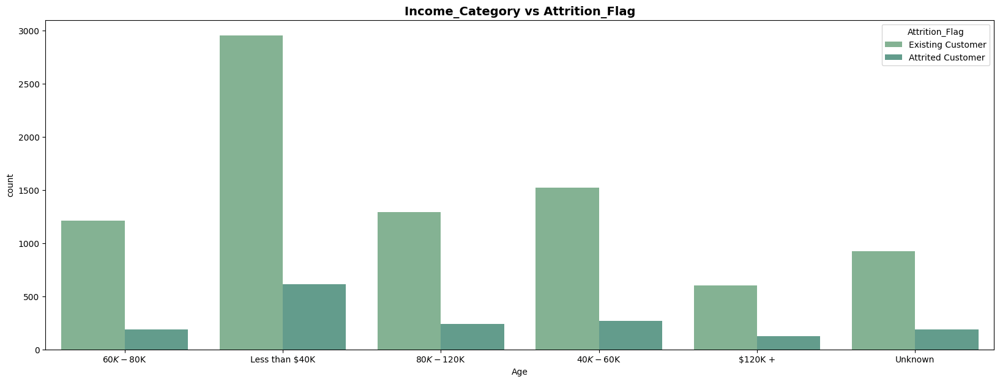

In [66]:
plt.figure(figsize=[20,7])
sns.countplot(x='Income_Category', hue='Attrition_Flag', data=df);
plt.title("Income_Category vs Attrition_Flag", fontweight="bold", size=14)
plt.xlabel('Age');

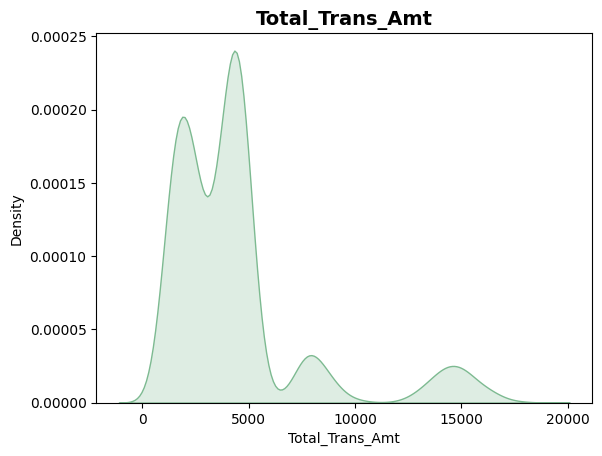

In [67]:
sns.kdeplot(data = df["Total_Trans_Amt"], fill=True)
plt.title('Total_Trans_Amt', fontweight="bold", size=14)
plt.show()

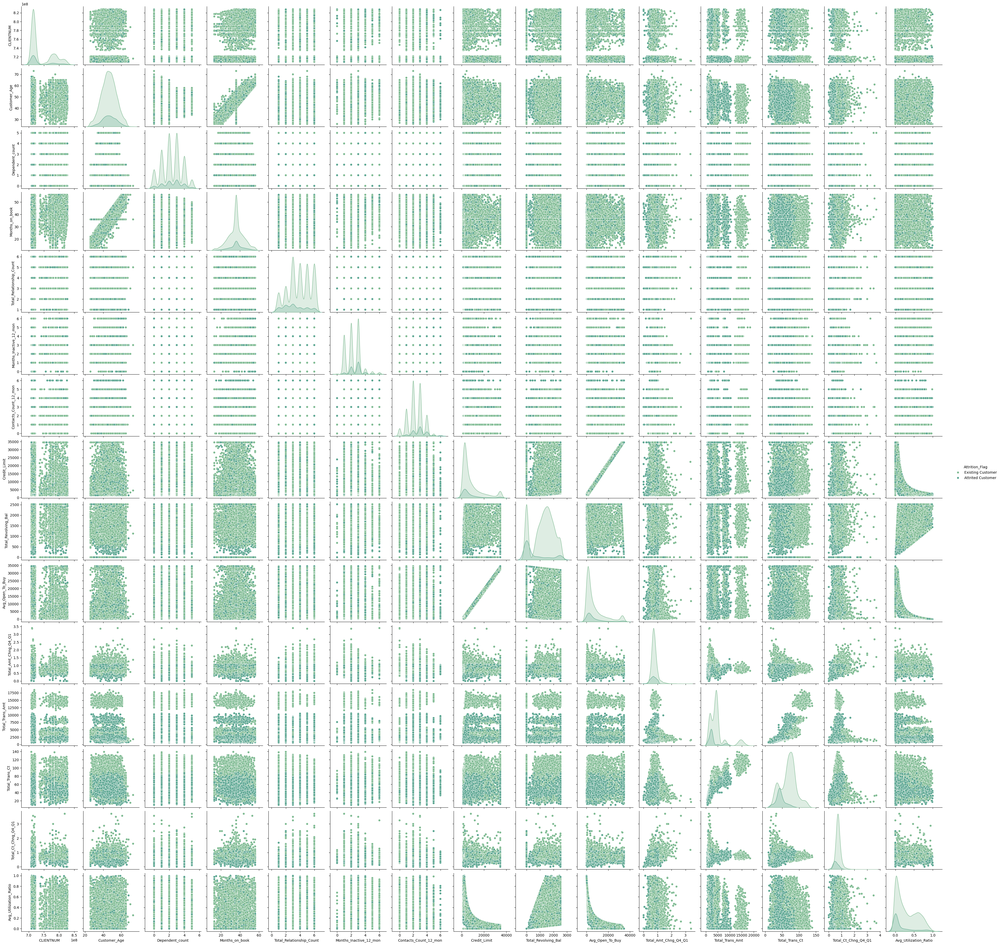

In [68]:
sns.pairplot(df, hue="Attrition_Flag")

## Correlation Heatmap

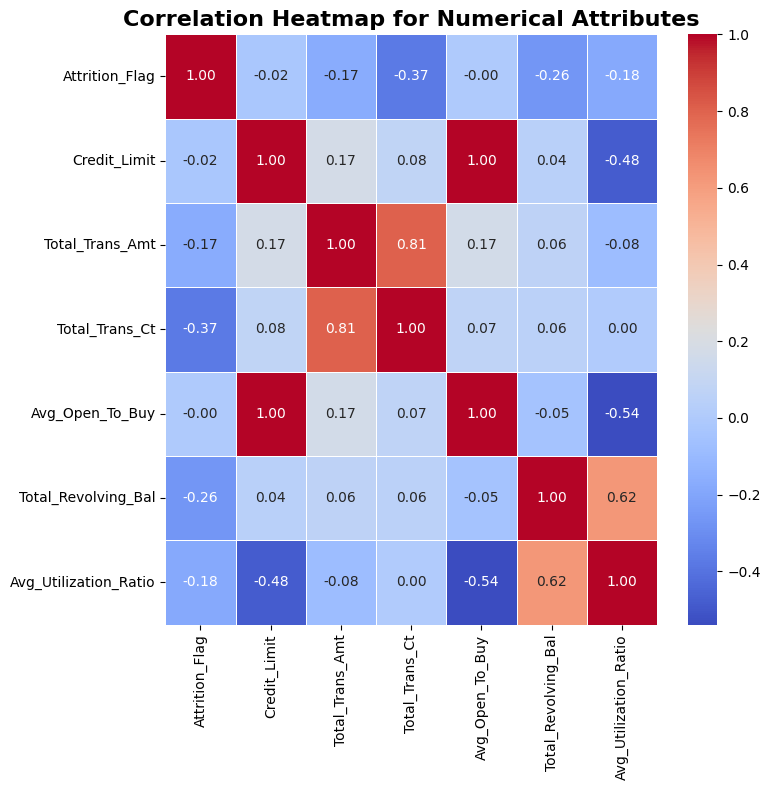

In [69]:
# Map categorical values to numeric (e.g., Existing Customer -> 0, Attrited Customer -> 1)
df['Attrition_Flag'] = df['Attrition_Flag'].map({'Existing Customer': 0, 'Attrited Customer': 1})

# Define behavioral variables for correlation
behavioral_vars1 = ['Attrition_Flag', 'Credit_Limit', 'Total_Trans_Amt', 'Total_Trans_Ct',
                    'Avg_Open_To_Buy', 'Total_Revolving_Bal', 'Avg_Utilization_Ratio']

# Recompute correlation matrix including Attrition_Flag
correlation_matrix = df[behavioral_vars1].corr()

# Plot heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap for Numerical Attributes', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


## Feature Selection

In [70]:
import pandas as pd
from sklearn.model_selection import train_test_split 
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

def selectkbest(indep_X, dep_Y, n):
    # Shift the data to ensure all values are non-negative
    indep_X_shifted = indep_X - indep_X.min().min()
    
    # Use chi2 after shifting the data
    test = SelectKBest(score_func=chi2, k=n)
    fit1 = test.fit(indep_X_shifted, dep_Y)
    selectk_features = fit1.transform(indep_X_shifted)
    selected_column = indep_X.columns[fit1.get_support(indices=True)]
    return selectk_features, selected_column


# Standard scalar function
def split_scalar(indep_X, dep_Y):
    X_train, X_test, y_train, y_test = train_test_split(indep_X, dep_Y, test_size=0.25, random_state=0)
    sc = StandardScaler()
    X_train = sc.fit_transform(X_train)
    X_test = sc.transform(X_test)    
    return X_train, X_test, y_train, y_test

# Function to evaluate models and generate confusion matrix and accuracy report
def cm_prediction(classifier, X_test, y_test):
    y_pred = classifier.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    return accuracy, report, cm

# Logistic Regression
def logistic(X_train, y_train, X_test, y_test):       
    classifier = LogisticRegression(random_state=0)
    classifier.fit(X_train, y_train)
    accuracy, report, cm = cm_prediction(classifier, X_test, y_test)
    return accuracy, report, cm      

# SVM Linear Kernel
def svm_linear(X_train, y_train, X_test, y_test):
    classifier = SVC(kernel='linear', random_state=0)
    classifier.fit(X_train, y_train)
    accuracy, report, cm = cm_prediction(classifier, X_test, y_test)
    return accuracy, report, cm

# SVM Non-linear Kernel
def svm_NL(X_train, y_train, X_test, y_test):
    classifier = SVC(kernel='rbf', random_state=0)
    classifier.fit(X_train, y_train)
    accuracy, report, cm = cm_prediction(classifier, X_test, y_test)
    return accuracy, report, cm

# Naive Bayes
def navie(X_train, y_train, X_test, y_test):       
    classifier = GaussianNB()
    classifier.fit(X_train, y_train)
    accuracy, report, cm = cm_prediction(classifier, X_test, y_test)
    return accuracy, report, cm

# K-Nearest Neighbors
def knn(X_train, y_train, X_test, y_test):
    classifier = KNeighborsClassifier(n_neighbors=5, metric='minkowski', p=2)
    classifier.fit(X_train, y_train)
    accuracy, report, cm = cm_prediction(classifier, X_test, y_test)
    return accuracy, report, cm

# Decision Tree Classifier
def decision(X_train, y_train, X_test, y_test):
    classifier = DecisionTreeClassifier(criterion='entropy', random_state=0)
    classifier.fit(X_train, y_train)
    accuracy, report, cm = cm_prediction(classifier, X_test, y_test)
    return accuracy, report, cm

# Random Forest Classifier
def random(X_train, y_train, X_test, y_test):
    classifier = RandomForestClassifier(n_estimators=10, criterion='entropy', random_state=0)
    classifier.fit(X_train, y_train)
    accuracy, report, cm = cm_prediction(classifier, X_test, y_test)
    return accuracy, report, cm

# Function to select features and apply models
def selectk_Classification(acclog, accsvml, accsvmnl, accknn, accnav, accdes, accrf):
    dataframe = pd.DataFrame(index=['ChiSquare'], columns=['Logistic', 'SVMl', 'SVMnl', 'KNN', 'Navie', 'Decision', 'Random'])
    min_length = min(len(acclog), len(accsvml), len(accsvmnl), len(accknn), len(accnav), len(accdes), len(accrf))
    
    for number in range(min_length):
        dataframe.loc['ChiSquare', 'Logistic'] = acclog[number]
        dataframe.loc['ChiSquare', 'SVMl'] = accsvml[number]
        dataframe.loc['ChiSquare', 'SVMnl'] = accsvmnl[number]
        dataframe.loc['ChiSquare', 'KNN'] = accknn[number]
        dataframe.loc['ChiSquare', 'Navie'] = accnav[number]
        dataframe.loc['ChiSquare', 'Decision'] = accdes[number]
        dataframe.loc['ChiSquare', 'Random'] = accrf[number]
    
    return dataframe

# Main Execution Flow
df1 = pd.read_csv("Preprocess_Bank_churners.csv", index_col=None)

# Convert Attrition_Flag to binary
y = np.where(df1['Attrition_Flag'] > 0, 1, 0)
X = df1.drop(columns=['Attrition_Flag'])

# Split data into train and test sets for evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Perform feature selection (if needed)
kbest, selected_column = selectkbest(X, y, 7)

# Train and evaluate models
acclog = []
accsvml = []
accsvmnl = []
accknn = []
accnav = []
accdes = []
accrf = []

# Logistic Regression
accuracy, report, cm = logistic(X_train, y_train, X_test, y_test)
acclog.append(accuracy)

# SVM Linear
accuracy, report, cm = svm_linear(X_train, y_train, X_test, y_test)
accsvml.append(accuracy)

# SVM Non-linear
accuracy, report, cm = svm_NL(X_train, y_train, X_test, y_test)
accsvmnl.append(accuracy)

# K-Nearest Neighbors
accuracy, report, cm = knn(X_train, y_train, X_test, y_test)
accknn.append(accuracy)

# Naive Bayes
accuracy, report, cm = navie(X_train, y_train, X_test, y_test)
accnav.append(accuracy)

# Decision Tree
accuracy, report, cm = decision(X_train, y_train, X_test, y_test)
accdes.append(accuracy)

# Random Forest
accuracy, report, cm = random(X_train, y_train, X_test, y_test)
accrf.append(accuracy)

# Compile Results
result = selectk_Classification(acclog, accsvml, accsvmnl, accknn, accnav, accdes, accrf)
print(result)

          Logistic      SVMl     SVMnl       KNN     Navie  Decision    Random
ChiSquare  0.90079  0.900296  0.924975  0.899309  0.874136  0.937808  0.958045


## Model Creation

In [71]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
import numpy as np

# Convert Attrition_Flag to binary
y = np.where(df1['Attrition_Flag'] > 0, 1, 0)
X = df1.drop(columns=['Attrition_Flag'])

# Define and fit the feature selector (e.g., SelectKBest)
fit1 = SelectKBest(score_func=f_classif, k=7)  # Select top 10 features
fit1.fit(X, y)

# Select columns based on the feature selector
selected_columns = X.columns[fit1.get_support(indices=True)]

# Filter the selected columns from X
X_selected = X[selected_columns]

# Split data into train and test sets for evaluation
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)


In [72]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Random Forest
print("\nRandom Forest:")
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
# Predictions and Evaluation on Test Data
y_pred_test_rf = rf.predict(X_test)
print("Random Forest Accuracy on Test Data:", accuracy_score(y_test, y_pred_test_rf))
print("Classification Report (Test Data):")
print(classification_report(y_test, y_pred_test_rf))


Random Forest:
Random Forest Accuracy on Test Data: 0.9496544916090819
Classification Report (Test Data):
              precision    recall  f1-score   support

           0       0.89      0.79      0.83       327
           1       0.96      0.98      0.97      1699

    accuracy                           0.95      2026
   macro avg       0.92      0.88      0.90      2026
weighted avg       0.95      0.95      0.95      2026



## Conclusion
## Therefore, Random Forest model achieved 95% accuracy, indicating their strong performance on the given dataset. This suggests that model effectively capture the underlying patterns and trends in the data.

## Deployment

In [73]:
# Save the model
import pickle
filename = "finalised_model.pkl"
with open(filename, 'wb') as file:
    pickle.dump(rf, file)

print(f"Model saved as {filename}")

Model saved as finalised_model.pkl


In [74]:
import pickle

# Load the saved model
filename = "finalised_model.pkl"
with open(filename, "rb") as file:
    loaded_model = pickle.load(file)

print(f"Model loaded successfully from {filename}")

# Example input data for prediction
# Ensure the input order matches the order of features used during training
input_data = [[12691.0,1144,1.625,11914.0, 45,0.061,42]]  # Replace these values with actual inputs

# Make prediction
result = loaded_model.predict(input_data)

# Interpret and print the result
if result[0] == 0:
    print("Prediction: Existing Customer")
else:
    print("Prediction: Attrited Customer")

Model loaded successfully from finalised_model.pkl
Prediction: Existing Customer


C:\Users\Malya\anaconda3\envs\aimlds\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
